In [1]:
import math
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from ipywidgets import IntProgress
import os
import cv2
import PIL
import PIL.Image
import json
import random
from random import randint as rand
from os import listdir
from os.path import isfile, join
gpus = tf.config.experimental.list_physical_devices('GPU')
print(gpus)
for gpu in gpus:
    tf.config.experimental.set_memory_growth(gpu, True)

[]


In [2]:
import xgboost as xgb

In [3]:
import random
import tensorflow as tf
import matplotlib.image as mpimg
import numpy as np


def generator():
    path = r'C:\Users\Ильяс\.cache\roboflow\PPE.v14i.yolokeras\update__annotations.txt'
    data = open(path, 'r').readlines()
    for el in data:
        path_image = el.replace('\n', '')
        path_label = (
            'C:\\Users\\Ильяс\\.cache\\roboflow\\PPE.v14i.yolokeras\\train\\labels\\'
            + path_image.split('\\')[-1].replace('\n', '') + '.txt'
        )

        bbox = []
        try:
            with open(path_label, 'r') as f:
                label = f.readlines()

            for e in label:
                if len(e) <= 1:
                    continue
                li = e.split()[1:]
                if len(li) < 4:
                    continue

                # Лейблы уже в формате x1, y1, x2, y2 (нормализованные 0..1) -> домножаем на 224
                x1 = float(li[0]) 
                y1 = float(li[1])
                x2 = float(li[2]) 
                y2 = float(li[3])
                w = x2-x1
                h=y2-y1

                x=(x1+x2)/2
                y=(y1+y2)/2
                x1=x
                y1=y
                x2=w
                y2=h
                

                bbox.append([x1, y1, x2, y2])
                if len(bbox) >= 50:
                    break
        except FileNotFoundError:
            continue

        try:
            image = tf.image.resize(
                tf.cast(mpimg.imread(path_image), tf.float32),
                (224, 224)
            ) / 255.0
        except Exception as e:
            continue

        if len(bbox) == 0:
            continue

        # Пока ротация только 0, поэтому боксы не меняем
        rotation = random.choice([0])
        rotated_image = tf.image.rot90(image, k=rotation)

        rotated_bbox = []
        for box in bbox:
            x1, y1, x2, y2 = box

            if rotation == 1:
                # ПРИМЕР (если будете включать ротацию 90°):
                # new_x1 = y1
                # new_y1 = 224 - x2
                # new_x2 = y2
                # new_y2 = 224 - x1
                # здесь можно дописать реальную логику, пока rotation=0 это не используется
                new_x1, new_y1, new_x2, new_y2 = x1, y1, x2, y2
            elif rotation == 2:
                # Аналогично, можно реализовать поворот на 180°
                new_x1, new_y1, new_x2, new_y2 = x1, y1, x2, y2
            elif rotation == 3:
                # Аналогично, поворот на 270°
                new_x1, new_y1, new_x2, new_y2 = x1, y1, x2, y2
            else:
                new_x1, new_y1, new_x2, new_y2 = x1, y1, x2, y2

            # Добавляем флаг 0 для GT боксов
            rotated_bbox.append([new_x1, new_y1, new_x2, new_y2, 0.0])

        

        all_boxes = rotated_bbox 

        yield (rotated_image, tf.constant(all_boxes, dtype=tf.float32))
def valid_generator():
    path = r'C:\Users\Ильяс\.cache\roboflow\PPE.v14i.yolokeras\update_test_annotations.txt'
    data = open(path, 'r').readlines()
    for el in data:
        path_image = el.replace('\n', '')
        path_label = (
            'C:\\Users\\Ильяс\\.cache\\roboflow\\PPE.v14i.yolokeras\\test\\labels\\'
            + path_image.split('\\')[-1].replace('\n', '') + '.txt'
        )

        bbox = []
        try:
            with open(path_label, 'r') as f:
                label = f.readlines()

            for e in label:
                if len(e) <= 1:
                    continue
                li = e.split()[1:]
                if len(li) < 4:
                    continue

                # Формат x1, y1, x2, y2 (нормализованные) -> домножаем на 224
                x1 = float(li[0]) 
                y1 = float(li[1]) 
                x2 = float(li[2]) 
                y2 = float(li[3]) 
                w=x2-x1
                h=y2-y1

                x=(x1+x2)/2
                y=(y1+y2)/2
                x1=x
                y1=y
                x2=w
                y2=h

                bbox.append([x1, y1, x2, y2])
                if len(bbox) >= 50:
                    break
        except FileNotFoundError:
            continue

        try:
            image = tf.image.resize(
                tf.cast(mpimg.imread(path_image), tf.float32),
                (224, 224)
            ) / 255.0
        except Exception as e:
            continue

        if len(bbox) == 0:
            continue

        # Добавляем флаг 0 для GT боксов в валидационном наборе
        bbox_with_flag = [[x1, y1, x2, y2, 0.0] for x1, y1, x2, y2 in bbox]

        yield (image, tf.constant(bbox_with_flag, dtype=tf.float32))
# Создаем datasets для одиночных примеров
dataset = tf.data.Dataset.from_generator(
    generator,
    output_signature=(
        tf.TensorSpec(shape=(224, 224, 3), dtype=tf.float32),
        tf.TensorSpec(shape=(None, 5), dtype=tf.float32)  # [x1, y1, x2, y2, flag]
    )
)

valid_dataset = tf.data.Dataset.from_generator(
    valid_generator,
    output_signature=(
        tf.TensorSpec(shape=(224, 224, 3), dtype=tf.float32),
        tf.TensorSpec(shape=(None, 5), dtype=tf.float32)  # [x1, y1, x2, y2, flag]
    )
)

# Кэшируем и перемешиваем (БЕЗ .batch()!)
dataset = dataset.cache().prefetch(buffer_size=tf.data.AUTOTUNE).shuffle(100)
valid_dataset = valid_dataset.cache().prefetch(buffer_size=tf.data.AUTOTUNE)


In [4]:
backbone_encoder = tf.keras.models.load_model(
    r'models/base_classifier.h5', 
    compile=False,
)

In [5]:
classifire = tf.keras.models.load_model(
    r'models/classifier.h5',
    compile=False
)

In [6]:
output_tensor = backbone_encoder.output
output_tensor = classifire.layers[1](output_tensor)
output_tensor = classifire.layers[2](output_tensor)
clipped_model = tf.keras.Model(backbone_encoder.input, output_tensor)

In [7]:
clipped_model.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                  ┃ Output Shape              ┃         Param # ┃ Connected to               ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)      │ (None, 224, 224, 3)       │               0 │ -                          │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ Conv1 (Conv2D)                │ (None, 112, 112, 32)      │             864 │ input_layer[0][0]          │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ bn_Conv1 (BatchNormalization) │ (None, 112, 112, 32)      │             128 │ Conv1[0][0]                │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ Conv1_relu (ReLU)             │ (None, 112, 112, 32)      │               0 │ bn_Conv1[0][0]             │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ expanded_conv_depthwise       │ (None, 112, 112, 32)      │             288 │ Conv1_relu[0][0]           │
│ (DepthwiseConv2D)             │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ expanded_conv_depthwise_BN    │ (None, 112, 112, 32)      │             128 │ expanded_conv_depthwise[0… │
│ (BatchNormalization)          │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ expanded_conv_depthwise_relu  │ (None, 112, 112, 32)      │               0 │ expanded_conv_depthwise_B… │
│ (ReLU)                        │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ expanded_conv_project         │ (None, 112, 112, 16)      │             512 │ expanded_conv_depthwise_r… │
│ (Conv2D)                      │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ expanded_conv_project_BN      │ (None, 112, 112, 16)      │              64 │ expanded_conv_project[0][… │
│ (BatchNormalization)          │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ block_1_expand (Conv2D)       │ (None, 112, 112, 96)      │           1,536 │ expanded_conv_project_BN[… │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ block_1_expand_BN             │ (None, 112, 112, 96)      │             384 │ block_1_expand[0][0]       │
│ (BatchNormalization)          │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ block_1_expand_relu (ReLU)    │ (None, 112, 112, 96)      │               0 │ block_1_expand_BN[0][0]    │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ block_1_pad (ZeroPadding2D)   │ (None, 113, 113, 96)      │               0 │ block_1_expand_relu[0][0]  │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ block_1_depthwise             │ (None, 56, 56, 96)        │             864 │ block_1_pad[0][0]          │
│ (DepthwiseConv2D)             │                           │               

 Total params: 763,840 (2.91 MB)

 Trainable params: 481,856 (1.84 MB)

 Non-trainable params: 281,984 (1.08 MB)

In [8]:
X = []
y = []

for el in dataset:
    X.append(clipped_model.predict(tf.expand_dims(el[0], axis = 0), verbose = 0))
    y.append(el[1][:, :-1])

X = np.array(X)


In [9]:
y = np.array(y, dtype=object) 

In [10]:
y = y.reshape(y.shape[0], -1)

In [11]:
X = X.reshape(X.shape[0], -1)

In [12]:
X.shape

(3725, 128)

In [13]:
y.shape

(3725, 1)

In [14]:
y = [el[0].numpy().flatten() for el in y]

In [15]:
max_len = max(len(el) for el in y)

In [16]:
y_padded = []
for arr in y:
    pad_size = max_len - len(arr)
    padded = np.pad(arr, (0, pad_size), mode='constant', constant_values=0)
    y_padded.append(padded)

y = np.array(y_padded)


In [17]:
y.shape

(3725, 200)

In [18]:
X_val = []
y_val = []
for el in valid_dataset:
    X_val.append(clipped_model.predict(tf.expand_dims(el[0], axis = 0), verbose = 0))
    y_val.append(el[1][:, :-1])

X_val = np.array(X_val)


In [19]:
y_val = np.array(y_val, dtype=object)

In [20]:
X_val = X_val.reshape(X_val.shape[0], -1)

In [21]:
y_val = [el[0].numpy().flatten() for el in y_val]

In [22]:
y_padded = []
for arr in y_val:
    pad_size = max_len - len(arr)
    padded = np.pad(arr, (0, pad_size), mode='constant', constant_values=0)
    y_padded.append(padded)

y_val = np.array(y_padded)

In [23]:
X_val.shape

(92, 128)

In [24]:
y_val.shape

(92, 200)

In [34]:
import numpy as np

# ---------------------------
# Objective: MSE + DIoU + Aspect (без IoU)
# ---------------------------

def mse_diou_ar_loss_xgboost_masked(preds, dtrain):
    """
    Loss = λ_mse * 0.5 * ||p - y||^2
         + λ_diou * (d^2 / c^2)
         + λ_ar   * v
    где v = (4/pi^2) * (atan(w_gt/h_gt) - atan(w/h))^2

    Padding маскируется: bbox валиден, если gt_w > eps и gt_h > eps.
    """
    labels = dtrain.get_label().reshape(-1, 200)  # [N, 200]
    preds = preds.reshape(-1, 200)

    n_samples = labels.shape[0]
    eps = 1e-7

    total_grad = np.zeros_like(preds, dtype=np.float32)
    total_hess = np.ones_like(preds, dtype=np.float32)

    for sample_idx in range(n_samples):
        sample_labels = labels[sample_idx].reshape(-1, 4)  # [50, 4]
        sample_preds  = preds[sample_idx].reshape(-1, 4)   # [50, 4]

        gt_w, gt_h = sample_labels[:, 2], sample_labels[:, 3]
        valid_mask = (gt_w > eps) & (gt_h > eps)
        if valid_mask.sum() == 0:
            continue

        valid_labels = sample_labels[valid_mask]
        valid_preds  = sample_preds[valid_mask]

        grad, hess = compute_mse_diou_ar_grad_single(valid_preds, valid_labels, eps=eps)

        grad_full = np.zeros((50, 4), dtype=np.float32)
        hess_full = np.ones((50, 4), dtype=np.float32)

        grad_full[valid_mask] = grad.reshape(-1, 4)
        hess_full[valid_mask] = hess.reshape(-1, 4)

        total_grad[sample_idx] = grad_full.flatten()
        total_hess[sample_idx] = hess_full.flatten()

    return total_grad.flatten(), total_hess.flatten()


def compute_mse_diou_ar_grad_single(preds, labels, eps=1e-7,
                                   lambda_mse=1.0, lambda_diou=1.0, lambda_ar=0.5,
                                   clip_grad=10.0):
    """
    Градиенты для Loss = MSE + DIoU(center) + Aspect(v), без IoU.
    Важно: это "smooth" суррогат; гессиан — диагональная положительная аппроксимация.
    """
    # raw preds (как есть, их и обновляет XGBoost)
    pred_cx = preds[:, 0]
    pred_cy = preds[:, 1]
    pred_w_raw = preds[:, 2]
    pred_h_raw = preds[:, 3]

    gt_cx = labels[:, 0]
    gt_cy = labels[:, 1]
    gt_w  = labels[:, 2]
    gt_h  = labels[:, 3]

    # safe widths/heights for geometry terms
    pred_w = np.clip(pred_w_raw, eps, None)
    pred_h = np.clip(pred_h_raw, eps, None)
    gt_w_s = np.clip(gt_w, eps, None)
    gt_h_s = np.clip(gt_h, eps, None)

    # --- MSE part (0.5 * (p-y)^2 => grad = (p-y), hess = 1)
    g_cx_mse = (pred_cx - gt_cx)
    g_cy_mse = (pred_cy - gt_cy)
    g_w_mse  = (pred_w_raw - gt_w)   # по raw, чтобы не "залипало" из-за clip
    g_h_mse  = (pred_h_raw - gt_h)

    # --- DIoU(center) part: d^2 / c^2 (берём только градиент по центрам; c^2 считаем константой)
    # Corners (для c^2)
    pred_x1, pred_y1 = pred_cx - pred_w / 2.0, pred_cy - pred_h / 2.0
    pred_x2, pred_y2 = pred_cx + pred_w / 2.0, pred_cy + pred_h / 2.0
    gt_x1, gt_y1     = gt_cx   - gt_w_s / 2.0, gt_cy   - gt_h_s / 2.0
    gt_x2, gt_y2     = gt_cx   + gt_w_s / 2.0, gt_cy   + gt_h_s / 2.0

    enc_x1, enc_y1 = np.minimum(pred_x1, gt_x1), np.minimum(pred_y1, gt_y1)
    enc_x2, enc_y2 = np.maximum(pred_x2, gt_x2), np.maximum(pred_y2, gt_y2)
    c_sq = (enc_x2 - enc_x1) ** 2 + (enc_y2 - enc_y1) ** 2 + eps

    g_cx_diou = 2.0 * (pred_cx - gt_cx) / c_sq
    g_cy_diou = 2.0 * (pred_cy - gt_cy) / c_sq

    # --- Aspect ratio part: v
    arctan_gt   = np.arctan(gt_w_s / gt_h_s)
    arctan_pred = np.arctan(pred_w / pred_h)
    diff = arctan_gt - arctan_pred

    denom = (pred_w ** 2 + pred_h ** 2 + eps)
    # v = (4/pi^2) * diff^2; grad(v) = (8/pi^2)*diff*grad(diff)
    # grad(diff) wrt w: - h/(w^2+h^2); wrt h: + w/(w^2+h^2)
    k = (8.0 / (np.pi ** 2)) * diff
    g_w_ar = k * (-(pred_h / denom))
    g_h_ar = k * (+(pred_w / denom))

    # --- combine
    grad_cx = lambda_mse * g_cx_mse + lambda_diou * g_cx_diou
    grad_cy = lambda_mse * g_cy_mse + lambda_diou * g_cy_diou
    grad_w  = lambda_mse * g_w_mse  + lambda_ar   * g_w_ar
    grad_h  = lambda_mse * g_h_mse  + lambda_ar   * g_h_ar

    grad = np.column_stack([grad_cx, grad_cy, grad_w, grad_h]).astype(np.float32)

    if clip_grad is not None:
        grad = np.clip(grad, -clip_grad, clip_grad)

    # Диагональный положительный hess (аппроксимация).
    # MSE даёт 1, DIoU даёт примерно 2/c_sq по центрам; aspect оставим как малую добавку.
    h_c = (lambda_mse * 1.0 + lambda_diou * (2.0 / c_sq)).astype(np.float32)
    h_w = np.full_like(pred_w_raw, lambda_mse * 1.0 + 1e-3, dtype=np.float32)
    h_h = np.full_like(pred_h_raw, lambda_mse * 1.0 + 1e-3, dtype=np.float32)

    hess = np.column_stack([h_c, h_c, h_w, h_h]).astype(np.float32)

    return grad.flatten(), hess.flatten()


# ---------------------------
# Metric: оставляем CIoU как метрику (как у тебя)
# ---------------------------

def ciou_metric_masked(preds, dtrain):
    labels = dtrain.get_label().reshape(-1, 200)
    preds = preds.reshape(-1, 200)

    eps = 1e-7
    all_ciou = []

    for i in range(labels.shape[0]):
        sample_labels = labels[i].reshape(-1, 4)
        sample_preds  = preds[i].reshape(-1, 4)

        valid = (sample_labels[:, 2] > eps) & (sample_labels[:, 3] > eps)
        if valid.sum() == 0:
            continue

        ciou_vals = compute_ciou_values(sample_preds[valid], sample_labels[valid], eps)
        all_ciou.extend(ciou_vals)

    return 'ciou', float(np.mean(all_ciou)) if all_ciou else 0.0


def compute_ciou_values(preds, labels, eps=1e-7):
    pred_cx, pred_cy, pred_w, pred_h = preds[:, 0], preds[:, 1], preds[:, 2], preds[:, 3]
    gt_cx, gt_cy, gt_w, gt_h = labels[:, 0], labels[:, 1], labels[:, 2], labels[:, 3]

    pred_w = np.clip(pred_w, eps, None)
    pred_h = np.clip(pred_h, eps, None)
    gt_w = np.clip(gt_w, eps, None)
    gt_h = np.clip(gt_h, eps, None)

    pred_x1, pred_y1 = pred_cx - pred_w/2, pred_cy - pred_h/2
    pred_x2, pred_y2 = pred_cx + pred_w/2, pred_cy + pred_h/2
    gt_x1, gt_y1 = gt_cx - gt_w/2, gt_cy - gt_h/2
    gt_x2, gt_y2 = gt_cx + gt_w/2, gt_cy + gt_h/2

    inter_w = np.maximum(np.minimum(pred_x2, gt_x2) - np.maximum(pred_x1, gt_x1), 0)
    inter_h = np.maximum(np.minimum(pred_y2, gt_y2) - np.maximum(pred_y1, gt_y1), 0)
    inter = inter_w * inter_h

    union = pred_w * pred_h + gt_w * gt_h - inter + eps
    iou = inter / union

    enc_x1, enc_y1 = np.minimum(pred_x1, gt_x1), np.minimum(pred_y1, gt_y1)
    enc_x2, enc_y2 = np.maximum(pred_x2, gt_x2), np.maximum(pred_y2, gt_y2)
    c_sq = (enc_x2 - enc_x1)**2 + (enc_y2 - enc_y1)**2 + eps

    d_sq = (pred_cx - gt_cx)**2 + (pred_cy - gt_cy)**2

    v = (4.0 / np.pi**2) * (np.arctan(gt_w/gt_h) - np.arctan(pred_w/pred_h))**2
    alpha = v / (1.0 - iou + v + eps)

    ciou = iou - d_sq/c_sq - alpha * v
    return ciou.tolist()


In [35]:
dtrain = xgb.DMatrix(X, label=y)
dval = xgb.DMatrix(X_val, label=y_val)

In [36]:
# Проверка данных
labels = dtrain.get_label().reshape(-1, 200)
valid_count = ((labels.reshape(-1, 4)[:, 2] > 0) & 
               (labels.reshape(-1, 4)[:, 3] > 0)).sum()
total_count = labels.reshape(-1, 4).shape[0]

print(f"Valid boxes: {valid_count}/{total_count} ({100*valid_count/total_count:.1f}%)")


Valid boxes: 13784/186250 (7.4%)


In [37]:
params = {
    "tree_method": "hist",
    "multi_strategy": "multi_output_tree",  # multi-target trees

    # Жестко режем размер дерева
    "grow_policy": "lossguide",
    "max_leaves": 16,        # 8/16/32: чем меньше, тем компактнее [page:1]
    "max_depth": 6,          # доп. ограничение глубины (уменьшает сложность) [page:1]

    # Делаем сплиты более консервативными -> меньше узлов
    "min_child_weight": 20,  # больше => более консервативно [page:1]
    "gamma": 1.0,            # больше => меньше разбиений [page:1]
    "reg_lambda": 5.0,       # L2, больше => более консервативно [page:1]
    "reg_alpha": 0.5,        # L1, больше => более консервативно [page:1]

    # Чтобы быстрее/компактнее при схожем качестве: чуть агрессивнее шаг и меньше раундов
    "eta": 0.10,             # eta — shrinkage [page:1]

    # Сэмплирование (не прямой «лимит размера», но помогает не раздувать модель)
    "subsample": 0.9,        # subsample происходит каждый boosting round [page:1]
    "colsample_bytree": 0.6, # доля фич на дерево [page:1]
    "colsample_bynode": 0.6, # доля фич на сплит [page:1]

    # Опционально: меньше бинов -> меньше вариантов сплитов (часто упрощает деревья)
    "max_bin": 128,          # hist/approx only [page:1]

    # Лог: убираем дефолтную метрику (например rmse), оставляем вашу custom_metric
    "disable_default_eval_metric": True,  # отключает default metric [page:1]
    "verbosity": 1,          # чтобы не было лишнего шума
}


model = xgb.train(
    params,
    dtrain,
    num_boost_round=2000,                
    obj=mse_diou_ar_loss_xgboost_masked,
    custom_metric=ciou_metric_masked,
    evals=[(dtrain, "train"), (dval, "val")],
    early_stopping_rounds=50,            # меньше patience => обычно меньше деревьев [web:21]
    verbose_eval=10,                     # печать каждые 10 итераций [web:22]
)



[0]	train-ciou:0.05989	val-ciou:-0.01165
[10]	train-ciou:0.10593	val-ciou:0.07831
[20]	train-ciou:0.12890	val-ciou:0.09983
[30]	train-ciou:0.14669	val-ciou:0.09619
[40]	train-ciou:0.16399	val-ciou:0.09728
[50]	train-ciou:0.18179	val-ciou:0.10715


In [39]:
dval = xgb.DMatrix(X_val)

In [40]:
y_pred = model.predict(dval)

In [41]:
from sklearn.metrics import mean_squared_error

In [42]:
def restore_bboxes_auto(padded_array, threshold=0):
    
    non_zero_indices = np.where(np.abs(padded_array) > threshold)[0]
    
    if len(non_zero_indices) == 0:
        return np.array([]).reshape(0, 4)
    
    last_non_zero = non_zero_indices[-1]
    
    num_elements = last_non_zero + 1
    
    if num_elements % 4 != 0:
        num_elements = (num_elements // 4) * 4
        print(f"Внимание: количество элементов {last_non_zero+1} не кратно 4. Используем {num_elements}")
    
    real_data = padded_array[:num_elements]
    
    num_bboxes = num_elements // 4
    
    return real_data.reshape(num_bboxes, 4)

restored_auto = restore_bboxes_auto(y_pred[0])
print(f"Автоматически восстановлено bbox: {restored_auto.shape}")

Автоматически восстановлено bbox: (50, 4)


In [43]:
y_pred = [restore_bboxes_auto(el) for el in y_pred]

In [44]:
images = [el[0] for el in valid_dataset]

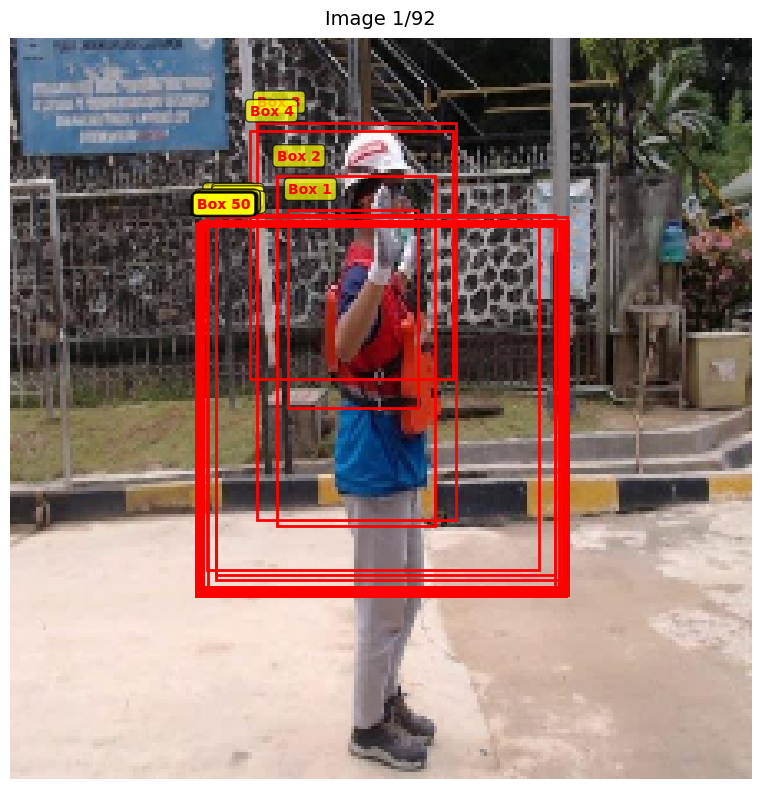

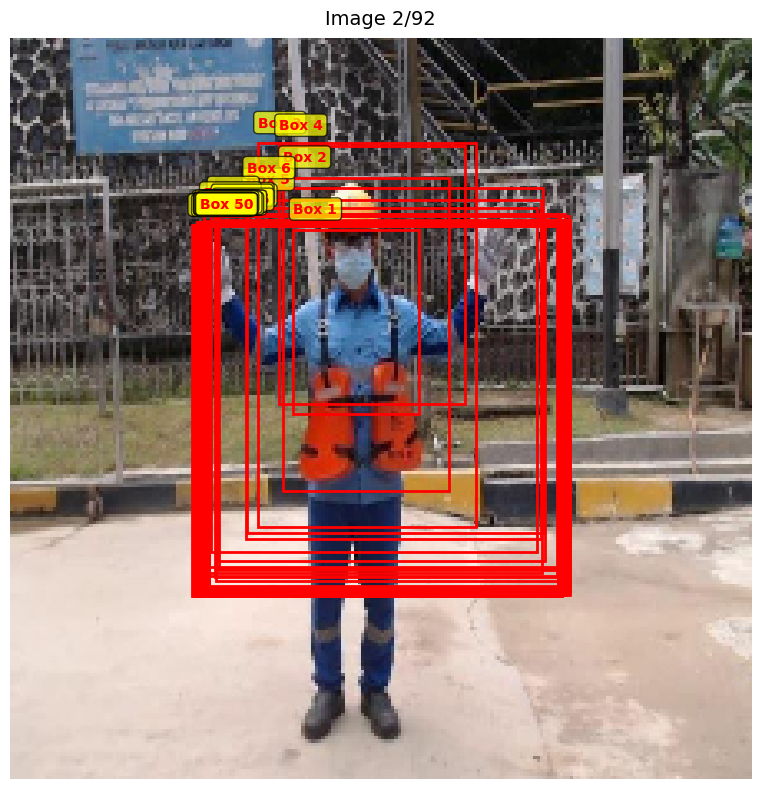

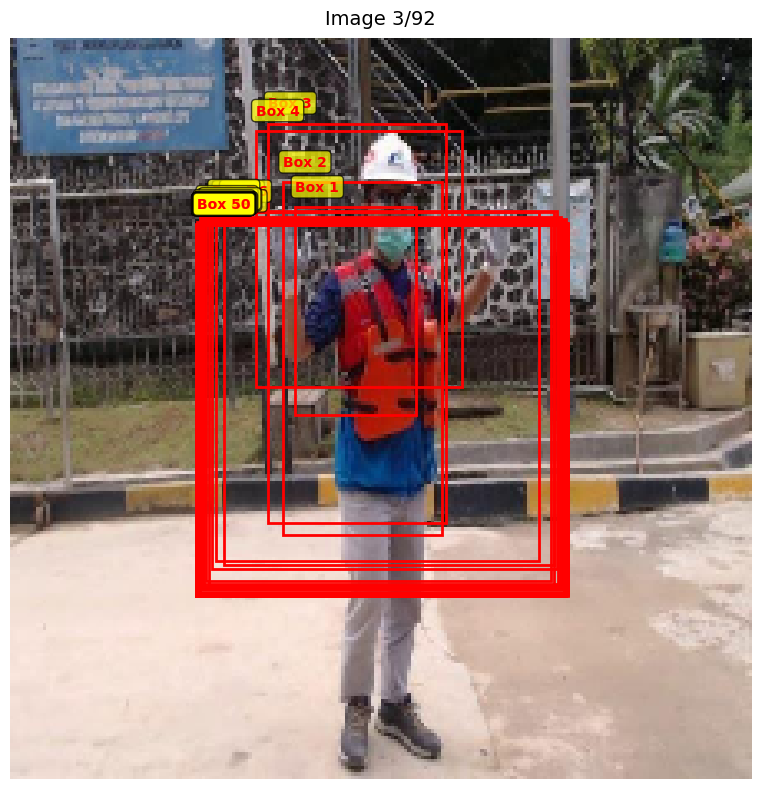

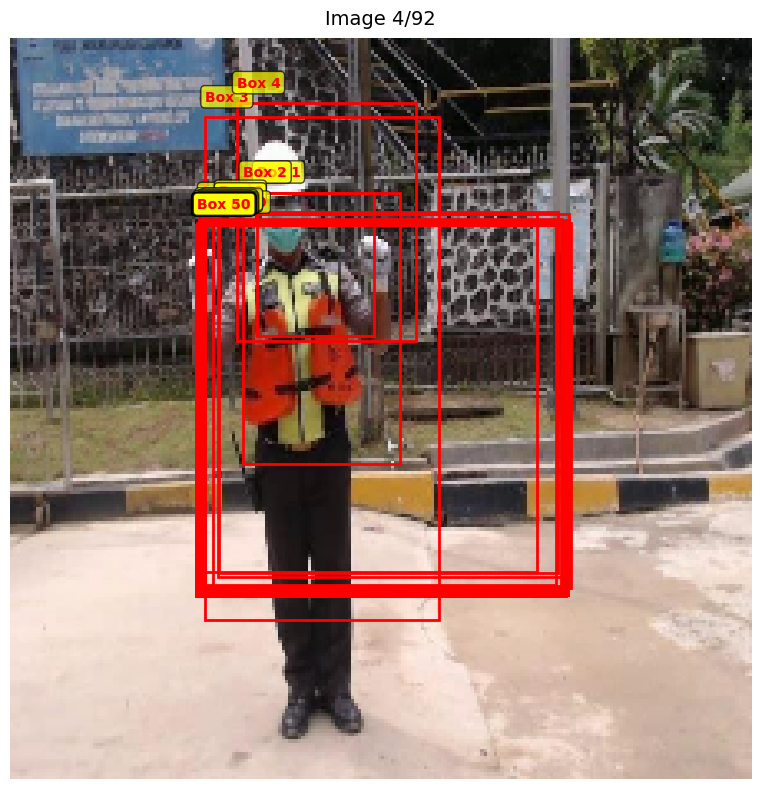

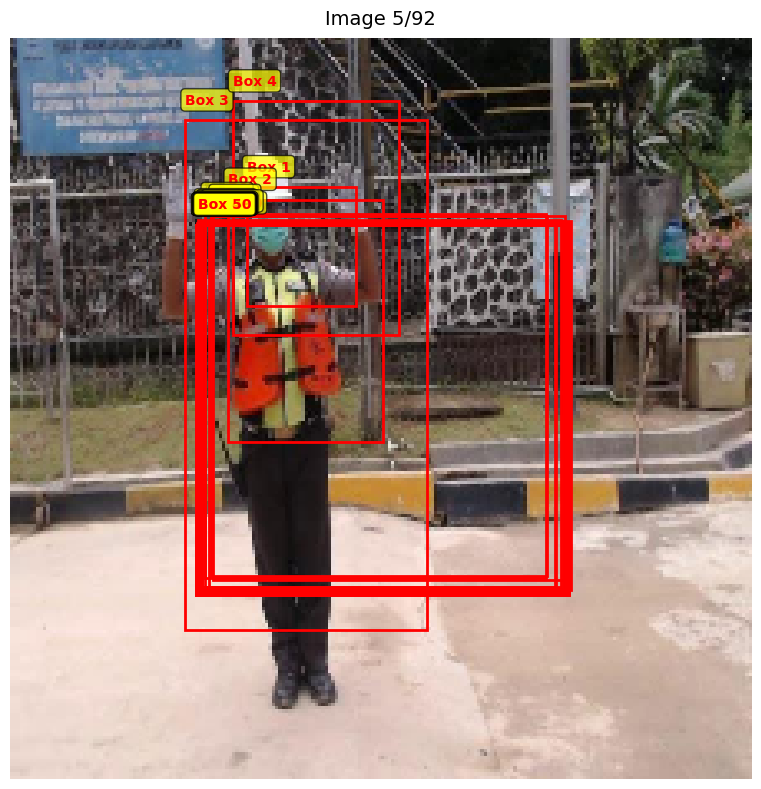

...

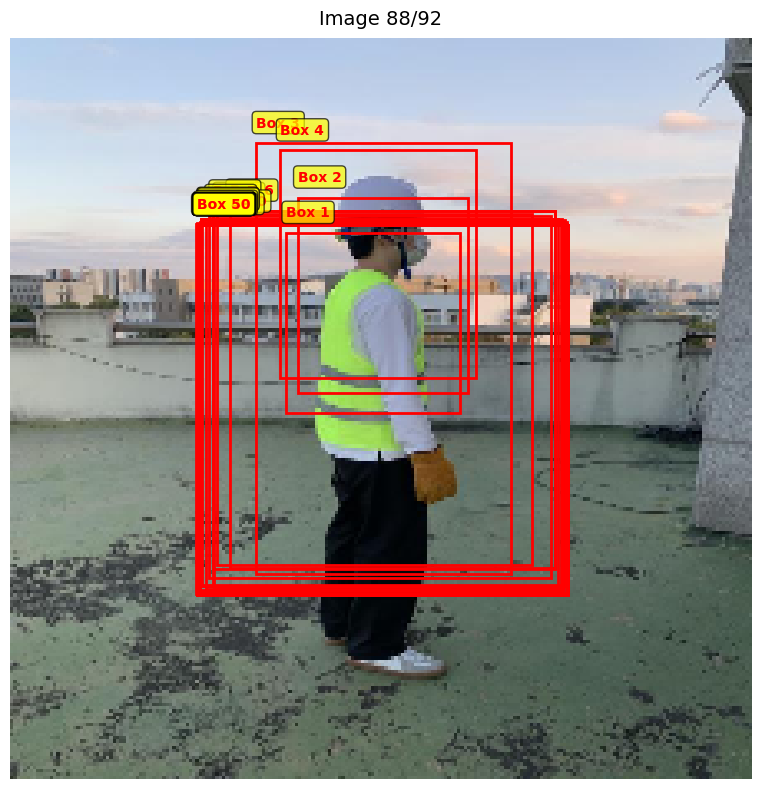

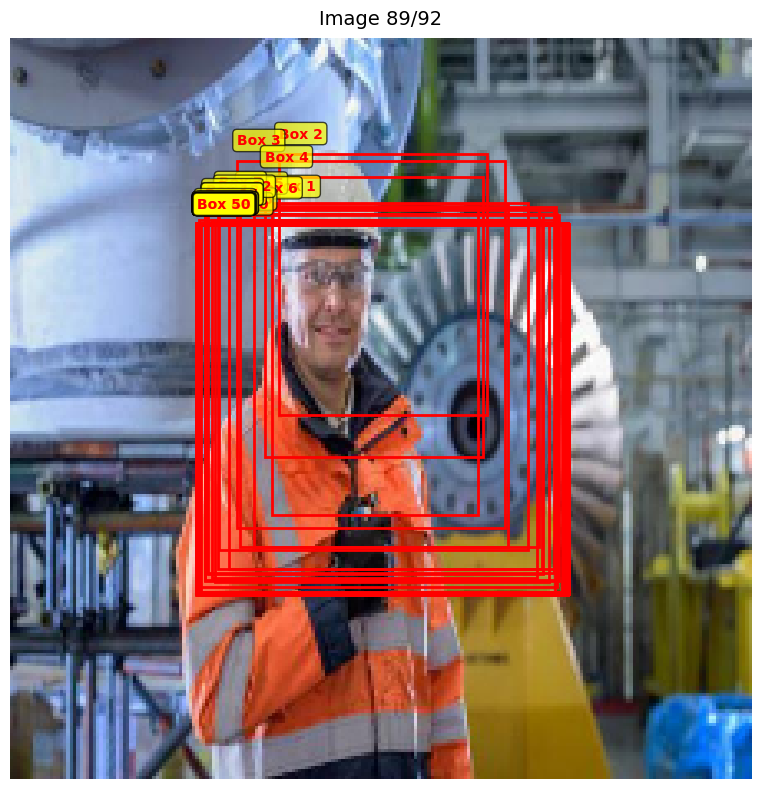

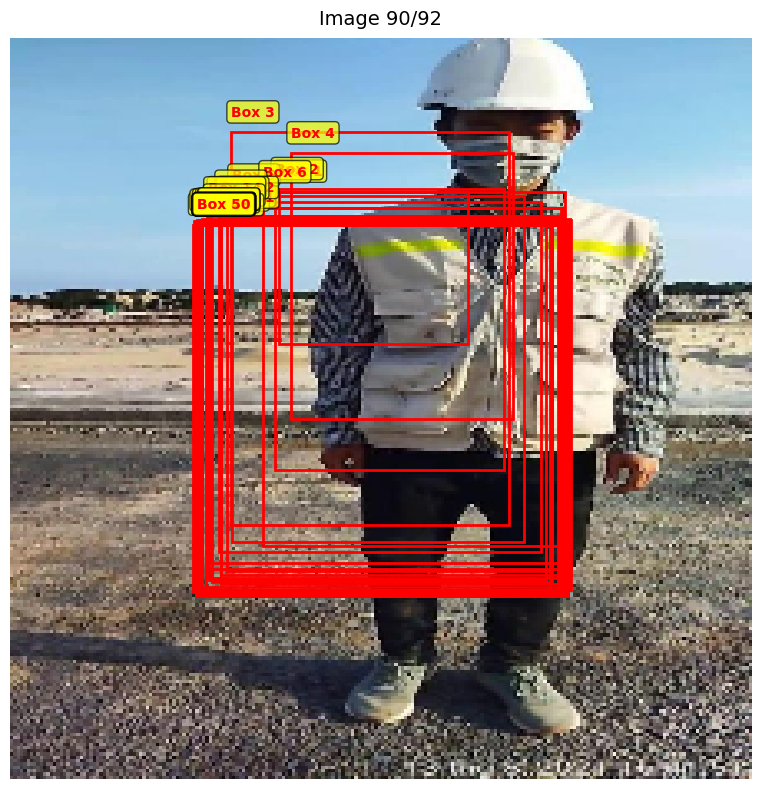

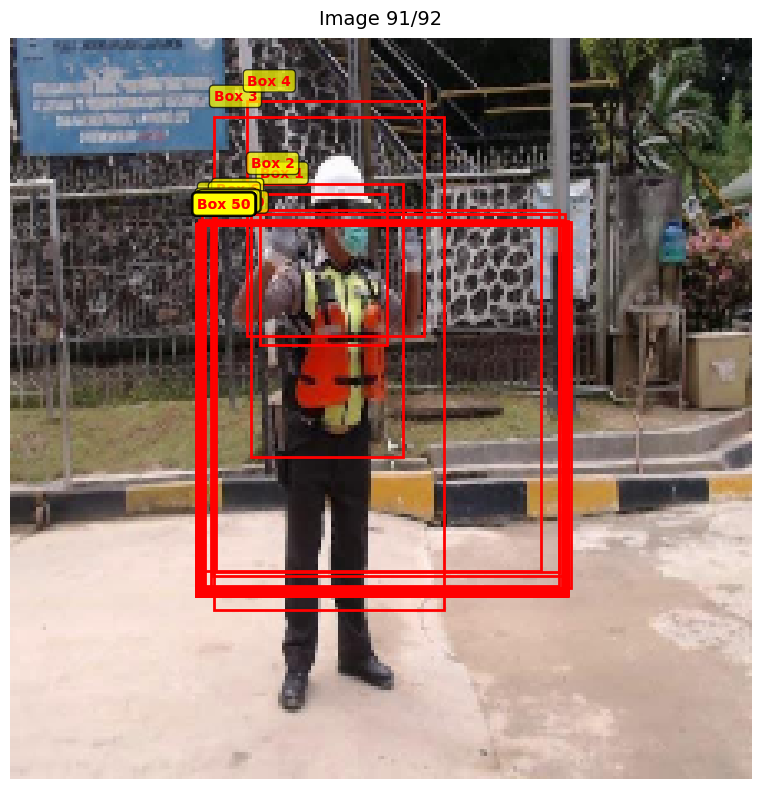

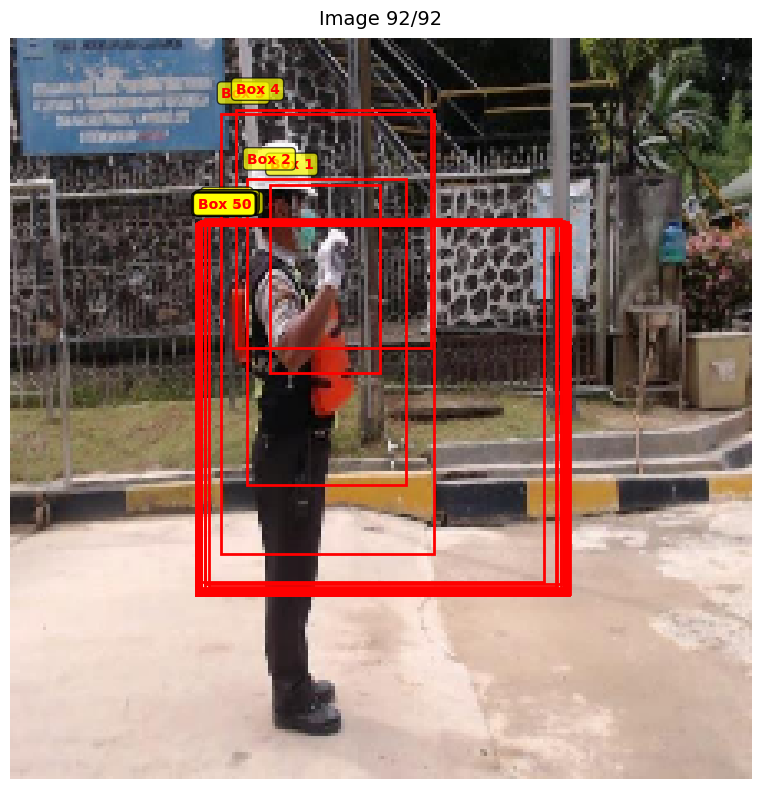


Отображено 92 изображений


In [45]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import numpy as np

def visualize_predictions(images, bboxes, num_samples=5, figsize=(12, 8), conf_threshold=0.5):
    
    
    num_to_show = min(num_samples, len(images), len(bboxes))
    
    for i in range(num_to_show):
        fig, ax = plt.subplots(1, figsize=figsize)
        
        ax.imshow(images[i])
        ax.axis('off')
        ax.set_title(f'Image {i+1}/{num_to_show}', fontsize=14, pad=10)
        
        img_bboxes = bboxes[i]
        
        if not isinstance(img_bboxes, (list, np.ndarray)):
            img_bboxes = [img_bboxes]
        
        if len(img_bboxes) == 0:
            ax.text(112, 112, 'No objects detected', 
                   ha='center', va='center', 
                   fontsize=12, color='red',
                   bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))
        else:
            for idx, bbox in enumerate(img_bboxes):
                if len(bbox) >= 4:
                    x, y, w, h = bbox[0] * 224, bbox[1] * 224, bbox[2] * 224, bbox[3] * 224
                    x-=w/2
                    y-=h/2
                    
                 
                    rect = patches.Rectangle(
                        (x, y), w, h,
                        linewidth=2,
                        edgecolor='red',
                        facecolor='none',
                        linestyle='-'
                    )
                    ax.add_patch(rect)
                    
                    ax.text(
                        x, y - 5,
                        f'Box {idx+1}',
                        color='red',
                        fontsize=10,
                        weight='bold',
                        bbox=dict(boxstyle='round,pad=0.3', facecolor='yellow', alpha=0.7)
                    )
                    
                    if len(bbox) >= 5:
                        conf = float(bbox[4])
                        if conf >= conf_threshold:
                            ax.text(
                                x, y + h + 15,
                                f'Conf: {conf:.2f}',
                                color='green',
                                fontsize=9,
                                bbox=dict(boxstyle='round,pad=0.2', facecolor='white', alpha=0.7)
                            )
        
        plt.tight_layout()
        plt.show()
    
    print(f'\nОтображено {num_to_show} изображений')



visualize_predictions(images, y_pred, num_samples=100)


In [ ]:
%pip install m2cgen

In [46]:
import m2cgen as m2c

In [47]:
model.save_model('models/XGBoost.ubj')

Весит 73Мб, что неприлично много